<a href="https://colab.research.google.com/github/Gunjit27/Automated_Traffic_Light/blob/main/Heart_Disease_XAI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,log_loss
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, classification_report



from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import RocCurveDisplay

In [ ]:
df = pd.read_csv("heart_disease2.csv")
df.shape # (rows, columns)

(4238, 16)

In [ ]:
df.head()

,Gender,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,Heartstroke
0,1,39,postgraduate,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,primaryschool,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1,48,uneducated,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0,61,graduate,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0,46,graduate,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0


In [ ]:
df["Heartstroke"].value_counts()

,count
Heartstroke,
0,3594
1,644


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4238 entries, 0 to 4237
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Gender           4238 non-null   int64  
 1   age              4238 non-null   int64  
 2   education        4133 non-null   object 
 3   currentSmoker    4238 non-null   int64  
 4   cigsPerDay       4209 non-null   float64
 5   BPMeds           4185 non-null   float64
 6   prevalentStroke  4238 non-null   int64  
 7   prevalentHyp     4238 non-null   int64  
 8   diabetes         4238 non-null   int64  
 9   totChol          4188 non-null   float64
 10  sysBP            4238 non-null   float64
 11  diaBP            4238 non-null   float64
 12  BMI              4219 non-null   float64
 13  heartRate        4237 non-null   float64
 14  glucose          3850 non-null   float64
 15  Heartstroke      4238 non-null   int64  
dtypes: float64(8), int64(7), object(1)
memory usage: 529.9+ KB


##Summary of Dataset

In [ ]:
df.describe()

,Gender,age,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,Heartstroke
count,4238.000000,4238.000000,4238.000000,4209.000000,4185.000000,4238.000000,4238.000000,4238.000000,4188.000000,4238.000000,4238.000000,4219.000000,4237.000000,3850.000000,4238.000000
mean,0.429212,49.584946,0.494101,9.003089,0.029630,0.005899,0.310524,0.025720,236.721585,132.352407,82.893464,25.802008,75.878924,81.966753,0.151958
std,0.495022,8.572160,0.500024,11.920094,0.169584,0.076587,0.462763,0.158316,44.590334,22.038097,11.910850,4.080111,12.026596,23.959998,0.359023
min,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,107.000000,83.500000,48.000000,15.540000,44.000000,40.000000,0.000000
25%,0.000000,42.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,206.000000,117.000000,75.000000,23.070000,68.000000,71.000000,0.000000
50%,0.000000,49.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,234.000000,128.000000,82.000000,25.400000,75.000000,78.000000,0.000000
75%,1.000000,56.000000,1.000000,20.000000,0.000000,0.000000,1.000000,0.000000,263.000000,144.000000,89.875000,28.040000,83.000000,87.000000,0.000000
max,1.000000,70.000000,1.000000,70.000000,1.000000,1.000000,1.000000,1.000000,696.000000,295.000000,142.500000,56.800000,143.000000,394.000000,1.000000


## Compare target column with sex column

In [ ]:
pd.crosstab(df.Heartstroke, df.Gender)

Gender,0,1
Heartstroke,,
0,2118,1476
1,301,343


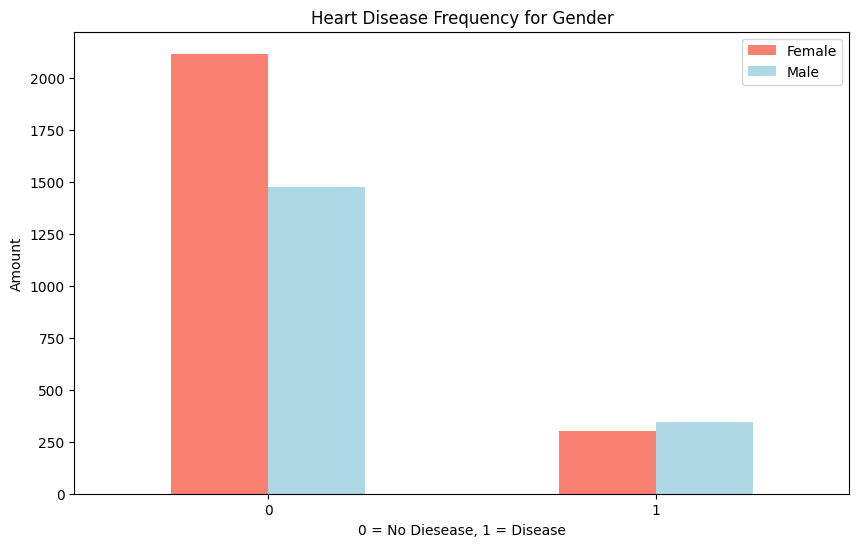

In [ ]:
# Create a plot of crosstab
pd.crosstab(df.Heartstroke, df.Gender).plot(kind="bar", figsize=(10, 6), color=["salmon", "lightblue"])

plt.title("Heart Disease Frequency for Gender")
plt.xlabel("0 = No Diesease, 1 = Disease")
plt.ylabel("Amount")
plt.legend(["Female", "Male"]);
plt.xticks(rotation=0);

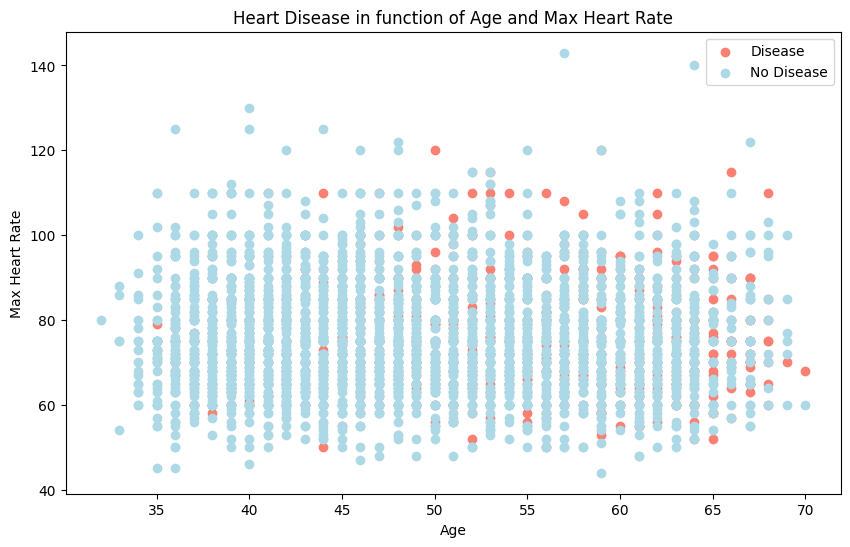

In [ ]:
# Create another figure
plt.figure(figsize=(10, 6))

# Scatter with postivie examples
plt.scatter(df.age[df.Heartstroke==1],
            df.heartRate[df.Heartstroke==1],
            c="salmon")

# Scatter with negative examples
plt.scatter(df.age[df.Heartstroke==0],
            df.heartRate[df.Heartstroke==0],
            c="lightblue")

# Add some helpful info
plt.title("Heart Disease in function of Age and Max Heart Rate")
plt.xlabel("Age")
plt.ylabel("Max Heart Rate")
plt.legend(["Disease", "No Disease"]);

#Checking Risk w.r.t Age

<ipython-input-10-2e71f71289ee>:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  age_risk = df.groupby(['age_group', 'Heartstroke'])['Gender'].count().unstack()


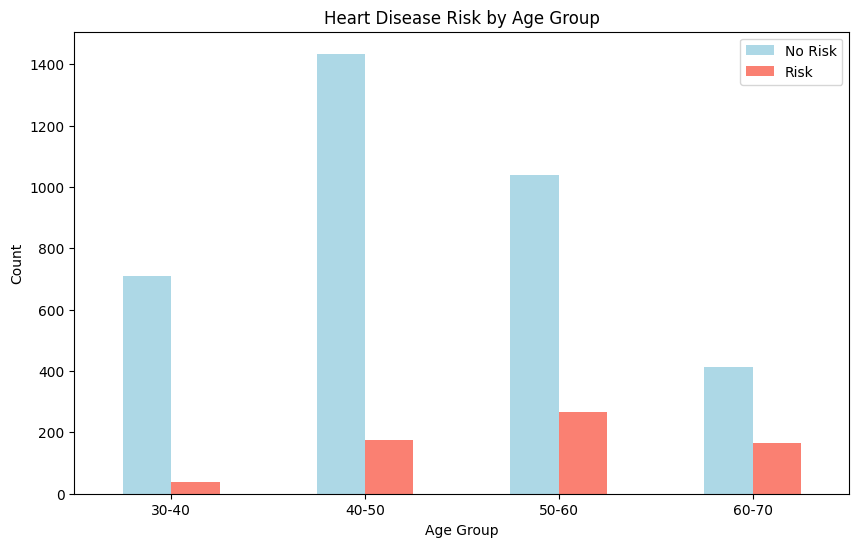

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
# Create a new column for age groups
df['age_group'] = pd.cut(df['age'], bins=[30, 40, 50, 60, 70], labels=['30-40', '40-50', '50-60', '60-70'])

# Group the data by age group and Heartstroke and count the number of occurrences
age_risk = df.groupby(['age_group', 'Heartstroke'])['Gender'].count().unstack()

# Plot the bar chart
age_risk.plot(kind='bar', figsize=(10, 6), color=['lightblue', 'salmon'])
plt.title('Heart Disease Risk by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.legend(['No Risk', 'Risk'])
plt.xticks(rotation=0)
plt.show()


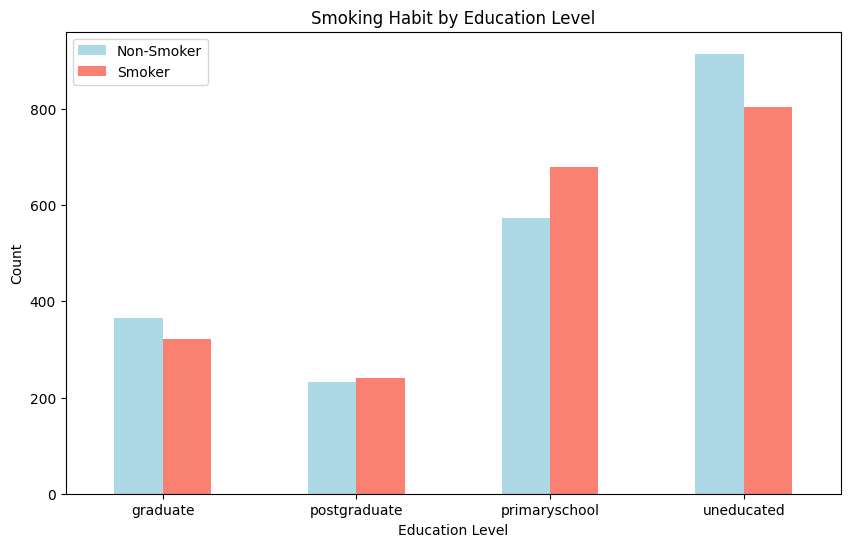

In [ ]:
import matplotlib.pyplot as plt
# Group the data by education level and smoking habit and count the number of occurrences
education_smoking = df.groupby(['education', 'currentSmoker'])['Gender'].count().unstack()

# Plot the bar chart
education_smoking.plot(kind='bar', figsize=(10, 6), color=['lightblue', 'salmon'])
plt.title('Smoking Habit by Education Level')
plt.xlabel('Education Level')
plt.ylabel('Count')
plt.legend(['Non-Smoker', 'Smoker'])
plt.xticks(rotation=0)
plt.show()


#Correlation matrix

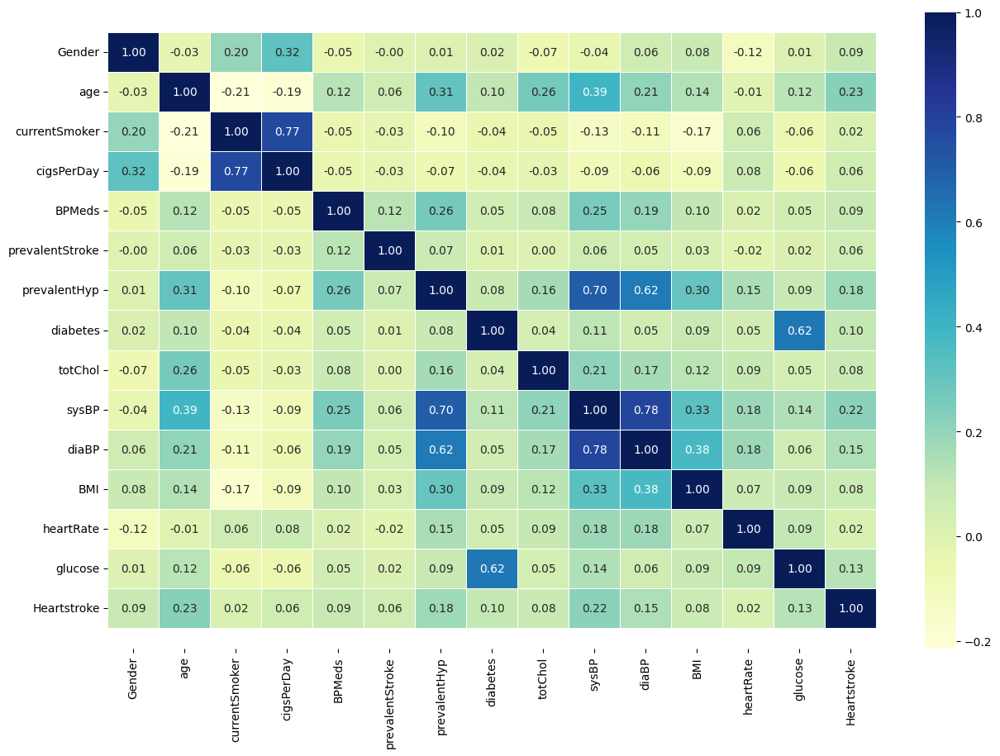

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the correlation matrix, only including numerical features
corr_matrix = df.corr(numeric_only=True)

fig, ax = plt.subplots(figsize=(15, 10))
ax = sns.heatmap(corr_matrix,
                 annot=True,
                 linewidths=0.5,
                 fmt=".2f",
                 cmap="YlGnBu")
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.show()

##Split data into X and y For Training and Testing

In [ ]:
X = df.drop("Heartstroke", axis=1)
y = df["Heartstroke"]

In [ ]:
from imblearn.over_sampling import RandomOverSampler


ROS = RandomOverSampler()
X, y = ROS.fit_resample(X, y)


In [ ]:
# Convert X and y to pandas DataFrames/Series if they are numpy arrays
X_df = pd.DataFrame(X)
y_series = pd.Series(y)

# Concatenate X and y into a single DataFrame
oversampled_data = pd.concat([X_df, y_series], axis=1)

# Define the path where you want to save the CSV file
csv_file_path = "oversampled_data.csv"

# Save the DataFrame to a CSV file
oversampled_data.to_csv(csv_file_path, index=False)

print("Oversampled data saved to", csv_file_path)


Oversampled data saved to oversampled_data.csv


In [ ]:
df1 = pd.read_csv("oversampled_data.csv")
df1.drop(columns="education",inplace=True)
df1.drop(columns="age_group",inplace=True)
df1.shape # (rows, columns)
df1["Heartstroke"].value_counts()

,count
Heartstroke,
0,3594
1,3594


In [ ]:
df1.head()

,Gender,age,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,Heartstroke
0,1,39,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1,48,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0,61,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0,46,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0


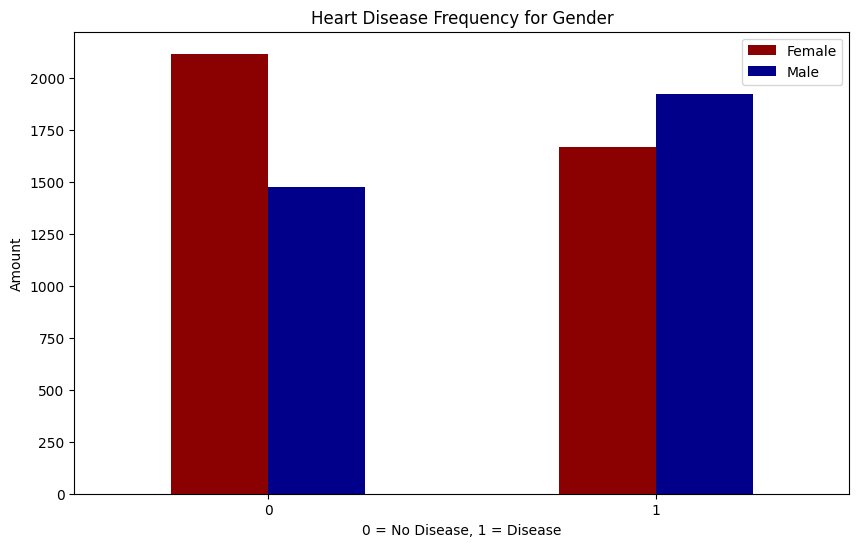

In [ ]:
#import matplotlib.pyplot as plt
#import pandas as pd

# Assuming df is your DataFrame containing 'Heartstroke' and 'Gender' columns

# Replace these with your actual DataFrame column names if they are different
heartstroke_column = 'Heartstroke'
gender_column = 'Gender'

# Assuming df is your DataFrame containing 'Heartstroke' and 'Gender' columns
pd.crosstab(df1[heartstroke_column], df1[gender_column]).plot(kind="bar", figsize=(10, 6), color=["darkred", "darkblue"])

plt.title("Heart Disease Frequency for Gender")
plt.xlabel("0 = No Disease, 1 = Disease")
plt.ylabel("Amount")
plt.legend(["Female", "Male"])
plt.xticks(rotation=0)
plt.show()


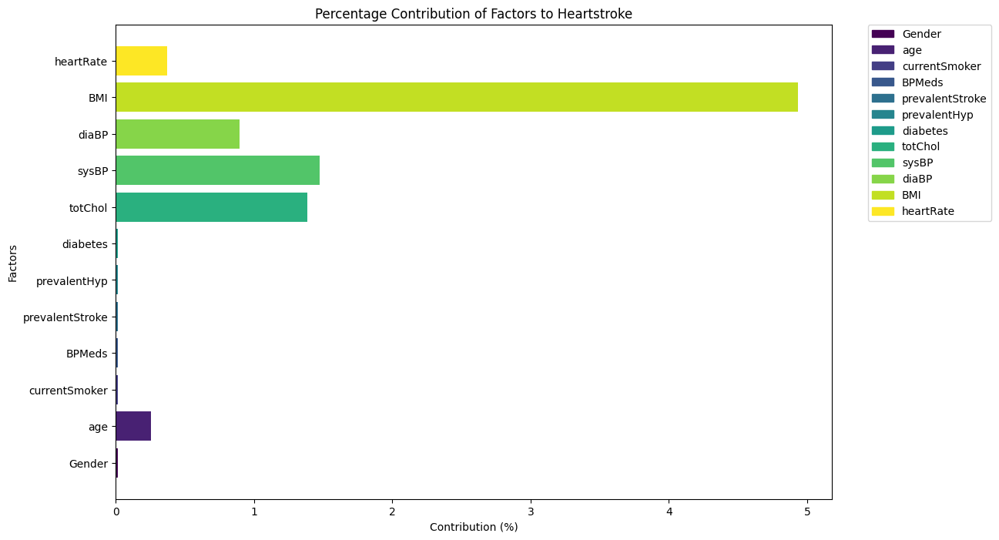

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

# Define the columns you want to analyze the dependency on
columns = ['Gender', 'age', 'currentSmoker', 'BPMeds', 'prevalentStroke', 'prevalentHyp', 'diabetes', 'totChol', 'sysBP', 'diaBP', 'BMI', 'heartRate']

# Calculate the percentage distribution of 'Heartstroke' for each category in each column
dependency_percentage = {}
total_samples = len(df1)
for column in columns:
    column_percentage = df1.groupby(column)['Heartstroke'].value_counts(normalize=True).unstack(fill_value=0) * 100
    dependency_percentage[column] = column_percentage.loc[:, 1].sum() / total_samples  # Summing up the percentage contribution of 'Heartstroke' = 1

# Plotting the pie chart with color scale
plt.figure(figsize=(12, 8))
colors = plt.cm.viridis(np.linspace(0, 1, len(dependency_percentage)))  # Choose a colormap

# Plotting pie chart
patches = []
for i, (factor, percentage) in enumerate(dependency_percentage.items()):
    patches.append(mpatches.Patch(color=colors[i], label=factor))
    plt.barh(factor, percentage, color=colors[i])

plt.title('Percentage Contribution of Factors to Heartstroke')
plt.xlabel('Contribution (%)')
plt.ylabel('Factors')

# Adding a color scale legend
plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()


Feature Importance:
            Feature  Importance
1               age    0.152598
9             sysBP    0.138106
8           totChol    0.125316
11              BMI    0.123327
13          glucose    0.116250
10            diaBP    0.114384
12        heartRate    0.101366
3        cigsPerDay    0.054031
6      prevalentHyp    0.023339
0            Gender    0.022877
2     currentSmoker    0.012500
4            BPMeds    0.008238
7          diabetes    0.005913
5   prevalentStroke    0.001755

Correlation with Target:
Heartstroke        1.000000
age                0.311885
sysBP              0.263194
prevalentHyp       0.227961
diaBP              0.176007
glucose            0.127108
Gender             0.124834
totChol            0.112946
BPMeds             0.111810
diabetes           0.111661
BMI                0.094563
cigsPerDay         0.077756
prevalentStroke    0.067141
heartRate          0.028922
currentSmoker      0.022816
Name: Heartstroke, dtype: float64


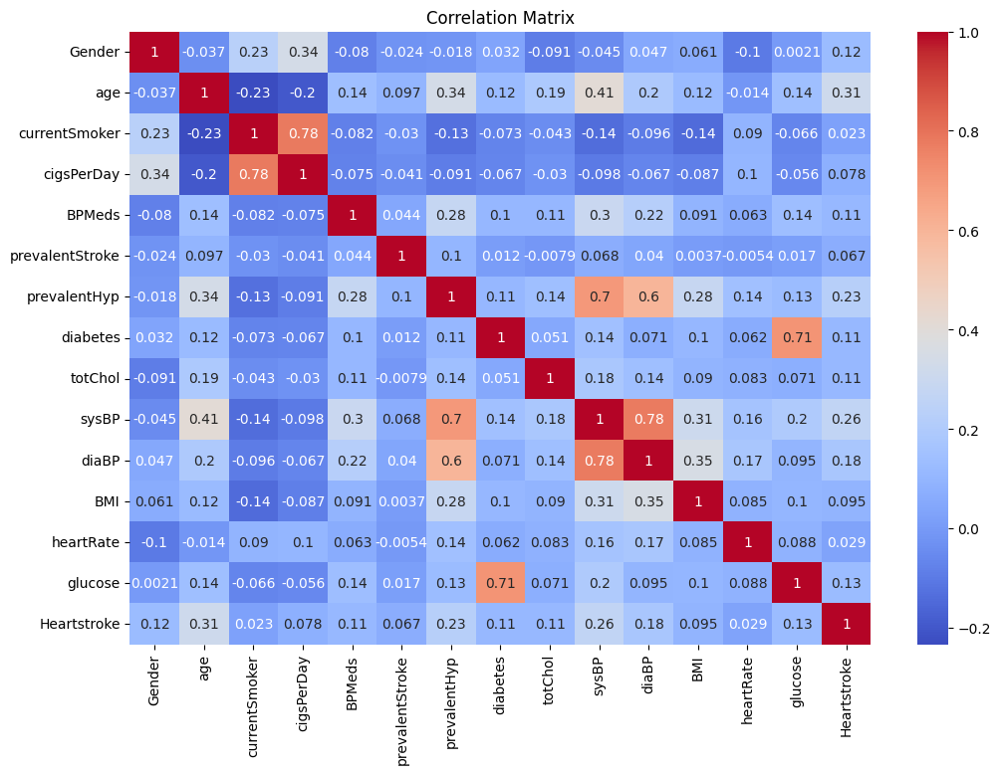

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer # import the imputer

# Assuming df1 is your DataFrame containing the features and the target variable 'Heartstroke'
# Extract features and target variable
X = df1.drop('Heartstroke', axis=1)
y = df1['Heartstroke']

# Convert string columns to numerical using LabelEncoder
for col in X.columns:
    if X[col].dtype == 'object':  # Check if column has string values
        le = LabelEncoder()
        X[col] = le.fit_transform(X[col])

# Impute missing values with the mean of each column
imputer = SimpleImputer(strategy='mean') # create an imputer instance
X_imputed = imputer.fit_transform(X) # fit and transform the data

# 1. Feature Importance
model = RandomForestClassifier()
model.fit(X_imputed, y)
feature_importance = model.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importance}) # Use original X.columns
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
print("Feature Importance:")
print(feature_importance_df)

# 2. Correlation Analysis
correlation_matrix = df1.corr()
correlation_with_target = correlation_matrix['Heartstroke'].abs().sort_values(ascending=False)
print("\nCorrelation with Target:")
print(correlation_with_target)

# 3. Domain Knowledge
# Review each feature based on domain knowledge and consider removing or combining irrelevant or redundant features

# Plotting correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [ ]:
# Split data into train and test sets
np.random.seed(42)

# Split into train & test set before dropping rows
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.2)

# Concatenate X_train and y_train into a single DataFrame
train_df = pd.concat([X_train, y_train], axis=1)

# Drop rows with missing values from the training set
train_df.dropna(inplace=True)

# Split the training set back into X_train and y_train
X_train = train_df.drop(columns=[y.name])
y_train = train_df[y.name]

# Drop rows with missing values from the testing set
test_df = pd.concat([X_test, y_test], axis=1)
test_df.dropna(inplace=True)

X_test = test_df.drop(columns=[y.name])
y_test = test_df[y.name]

In [ ]:
X_train, len(X_train)

(      Gender  age  currentSmoker  cigsPerDay  BPMeds  prevalentStroke  \
 7151       1   48              1        10.0     0.0                0   
 6253       1   62              1        20.0     0.0                0   
 4666       0   49              1         5.0     0.0                0   
 940        0   53              0         0.0     0.0                0   
 1511       0   38              0         0.0     0.0                0   
 ...      ...  ...            ...         ...     ...              ...   
 3772       1   39              1        10.0     0.0                0   
 5191       1   55              0         0.0     0.0                0   
 5226       1   46              1        30.0     0.0                0   
 5390       0   37              1        20.0     0.0                0   
 860        0   35              0         0.0     0.0                0   
 
       prevalentHyp  diabetes  totChol  sysBP  diaBP    BMI  heartRate  glucose  
 7151             0         

In [ ]:
y_train, len(y_train)

(7151    1
 6253    1
 4666    1
 940     0
 1511    0
        ..
 3772    0
 5191    1
 5226    1
 5390    1
 860     0
 Name: Heartstroke, Length: 5089, dtype: int64,
 5089)

##Put models in a dictionary

In [ ]:
## Defining & running the Classifier Models

classifiers = {
    "KNN": KNeighborsClassifier(3),
    "SVC": SVC(kernel="rbf", C=0.025, probability=True),
    "Decision Tree Classifier": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "GaussianNB": GaussianNB(),
    "Logistic Regression": LogisticRegression()}

# Logging for Visual Comparison

log_cols=["Classifier", "Accuracy"]
log = pd.DataFrame(columns=log_cols)

m_scores = {}
for name,clf in classifiers.items():
    clf.fit(X_train, y_train)

    train_predictions = clf.predict(X_test)
    m_scores[name] = accuracy_score(y_test, train_predictions)
    print(f"{clf}"+": {:.5%}".format(m_scores[name]))

print(f'\033[94m='*30)

KNeighborsClassifier(n_neighbors=3): 83.35975%
SVC(C=0.025, probability=True): 62.36133%
DecisionTreeClassifier(): 92.31379%
RandomForestClassifier(): 97.06815%
GaussianNB(): 62.04437%
LogisticRegression(): 64.26307%


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


##Accuracy Bar-Plot

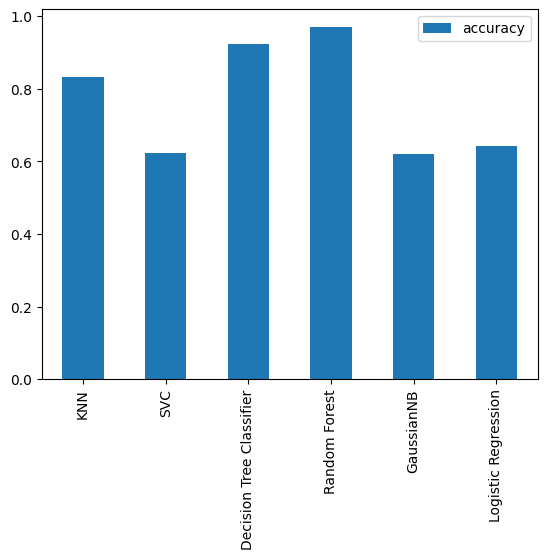

In [ ]:
model_compare = pd.DataFrame(m_scores, index=["accuracy"])
model_compare.T.plot.bar();

In [ ]:
# Fitting the given dataset in Random Forest
from sklearn.ensemble import RandomForestClassifier

ensemble = RandomForestClassifier(random_state=3)

ensemble.fit(X_train, y_train)

y_preds2 = ensemble.predict(X_test)
y_preds2


from sklearn.metrics import accuracy_score
ac1=accuracy_score(y_test,y_preds2)*100
ac1

97.30586370839937

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

neighbors = KNeighborsClassifier()

neighbors.fit(X_train, y_train)

y_preds3 = neighbors.predict(X_test)
y_preds3
ac2=accuracy_score(y_test,y_preds3)*100
ac2

77.65451664025356

In [ ]:
# Create a hyperparameter grid for LogisticRegression
log_reg_grid = {"C": np.logspace(-4, 4, 20),
                "solver": ["liblinear"]}

# Create a hyperparameter grid for RandomForestClassifier
rf_grid = {"n_estimators": np.arange(10, 1000, 50),
           "max_depth": [None, 3, 5, 10],
           "min_samples_split": np.arange(2, 20, 2),
           "min_samples_leaf": np.arange(1, 20, 2)}


In [ ]:
# Tune LogisticRegression

np.random.seed(42)

# Setup random hyperparameter search for LogisticRegression
rs_log_reg = RandomizedSearchCV(LogisticRegression(),
                                param_distributions=log_reg_grid,
                                cv=5,
                                n_iter=20,
                                verbose=True)

# Fit random hyperparameter search model for LogisticRegression
rs_log_reg.fit(X_train, y_train)
y_preds4 = neighbors.predict(X_test)
y_preds4
ac3=accuracy_score(y_test,y_preds4)*100
ac3

Fitting 5 folds for each of 20 candidates, totalling 100 fits


77.65451664025356

In [ ]:
rs_log_reg.best_params_

{'solver': 'liblinear', 'C': 0.23357214690901212}

In [ ]:
# Setup random seed
np.random.seed(42)

# Setup random hyperparameter search for RandomForestClassifier
rs_rf = RandomizedSearchCV(RandomForestClassifier(),
                           param_distributions=rf_grid,
                           cv=5,
                           n_iter=20,
                           verbose=True)

# Fit random hyperparameter search model for RandomForestClassifier()
rs_rf.fit(X_train, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_iter=20,
                   param_distributions={'max_depth': [None, 3, 5, 10],
                                        'min_samples_leaf': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19]),
                                        'min_samples_split': array([ 2,  4,  6,  8, 10, 12, 14, 16, 18]),
                                        'n_estimators': array([ 10,  60, 110, 160, 210, 260, 310, 360, 410, 460, 510, 560, 610,
       660, 710, 760, 810, 860, 910, 960])},
                   verbose=True)

In [ ]:
# Find the best hyperparameters
rs_rf.best_params_

{'n_estimators': 510,
 'min_samples_split': 14,
 'min_samples_leaf': 1,
 'max_depth': None}

In [ ]:
# Evaluate the randomized search RandomForestClassifier model
rs_rf.score(X_test, y_test)

0.9374009508716323

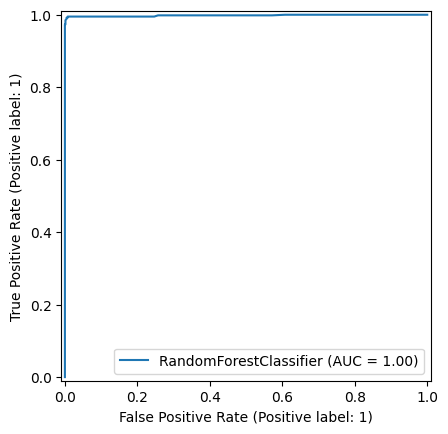

In [ ]:
# Plot ROC curve and calculate and calculate AUC metric
RocCurveDisplay.from_estimator(ensemble, X_test, y_test)

##Confusion Matrix

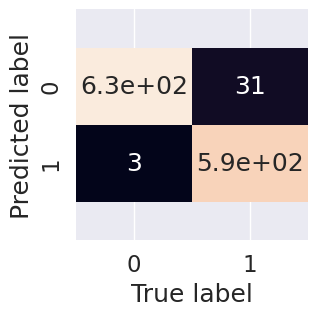

In [ ]:
sns.set(font_scale=1.5)

def plot_conf_mat(y_test, y_preds):
    """
    Plots a nice looking confusion matrix using Seaborn's heatmap()
    """
    fig, ax = plt.subplots(figsize=(3, 3))
    ax = sns.heatmap(confusion_matrix(y_test, y_preds2),
                     annot=True,
                     cbar=False)
    plt.xlabel("True label")
    plt.ylabel("Predicted label")

    bottom, top = ax.get_ylim()
    ax.set_ylim(bottom + 0.5, top - 0.5)

plot_conf_mat(y_test, y_preds2)

##Classification Report

In [ ]:
print(classification_report(y_test, y_preds2))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97       665
           1       0.95      0.99      0.97       597

    accuracy                           0.97      1262
   macro avg       0.97      0.97      0.97      1262
weighted avg       0.97      0.97      0.97      1262



In [ ]:
feature_importance = model.feature_importances_

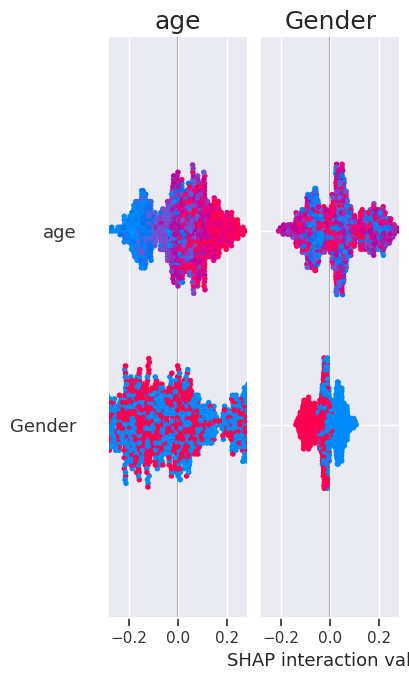

In [ ]:
import shap

# Train SHAP explainer
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

# Summary plot for feature importance
shap.summary_plot(shap_values, X_test)


In [ ]:
# import warnings
# warnings.simplefilter(action='ignore', category=FutureWarning)

In [ ]:
print(X_test.iloc[0])

Gender               1.00
age                 53.00
currentSmoker        1.00
cigsPerDay           3.00
BPMeds               0.00
prevalentStroke      0.00
prevalentHyp         0.00
diabetes             0.00
totChol            218.00
sysBP              120.00
diaBP               80.00
BMI                 29.87
heartRate           90.00
glucose             73.00
Name: 4963, dtype: float64


In [ ]:
print(y_test.iloc[0])

1


In [ ]:
%pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 15.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=afa321ddd4a0a18a99bb315a6164bbe15c2357a7fde36e9554f5d7fc1a2cb749
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
from lime.lime_tabular import LimeTabularExplainer

explainer = LimeTabularExplainer(X_train.values,
                                 feature_names=X_train.columns,
                                 class_names=['No Stroke', 'Stroke'],
                                 mode='classification')
exp = explainer.explain_instance(X_test.iloc[0], model.predict_proba)
exp.show_in_notebook(show_all=False)


/usr/local/lib/python3.10/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.10/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.10/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

Enter value for Gender: 1
Enter value for age: 39
Enter value for currentSmoker: 0
Enter value for cigsPerDay: 0
Enter value for BPMeds: 0
Enter value for prevalentStroke: 0
Enter value for prevalentHyp: 0
Enter value for diabetes: 0
Enter value for totChol: 195
Enter value for sysBP: 106
Enter value for diaBP: 70
Enter value for BMI: 26
Enter value for heartRate: 80
Enter value for glucose: 77
Predicted Class: 0


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:486: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


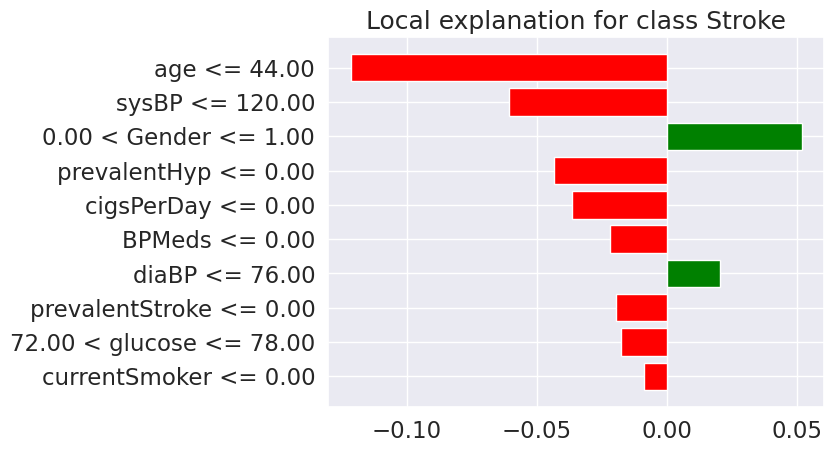

In [ ]:
import pandas as pd
from lime.lime_tabular import LimeTabularExplainer
import matplotlib.pyplot as plt


# Define the features based on your dataset's column names
features = X_train.columns

# Step 1: Take User Input
user_input = {}
for feature in features:
    user_input[feature] = float(input(f"Enter value for {feature}: "))

# Convert the user input to a DataFrame for model compatibility
user_input_df = pd.DataFrame([user_input])

user_input_df_values = user_input_df.values
prediction = model.predict(user_input_df)
print("Predicted Class:", prediction[0])

explainer = LimeTabularExplainer(X_train.values,
                                 feature_names=features,
                                 class_names=['No Stroke', 'Stroke'],
                                 mode='classification')

# Explain the prediction
exp = explainer.explain_instance(user_input_df.values[0], model.predict_proba)

# Show explanation plot
exp.show_in_notebook(show_all=False)
exp.as_pyplot_figure()
plt.show()


In [ ]:
import pandas as pd
import plotly.express as px
from lime.lime_tabular import LimeTabularExplainer


features = X_train.columns

user_input = {feature: float(input(f"Enter value for {feature}: ")) for feature in features}
user_input_df = pd.DataFrame([user_input])

user_input_np = user_input_df.to_numpy()

# Make a prediction with the model
prediction = model.predict(user_input_np)
print("Predicted Class:", prediction[0])

# Generate the LIME explanation for the prediction
explainer = LimeTabularExplainer(X_train.values,
                                 feature_names=features,
                                 class_names=['No Stroke', 'Stroke'],
                                 mode='classification')

exp = explainer.explain_instance(user_input_np[0], model.predict_proba)

# Step 1: Extract LIME explanation values for the pie chart
feature_names = [x[0] for x in exp.as_list()]
feature_importance = [abs(x[1]) for x in exp.as_list()]

# Step 2: Create an interactive pie chart with Plotly
fig = px.pie(
    values=feature_importance,
    names=feature_names,
    title="Feature Influence on Prediction",
    color_discrete_sequence=px.colors.sequential.Viridis
)

fig.update_traces(textinfo='percent+label', pull=[0.1]*len(feature_importance))  # Pull out slices for visibility
fig.show(renderer="notebook")

Predicted Class: 0


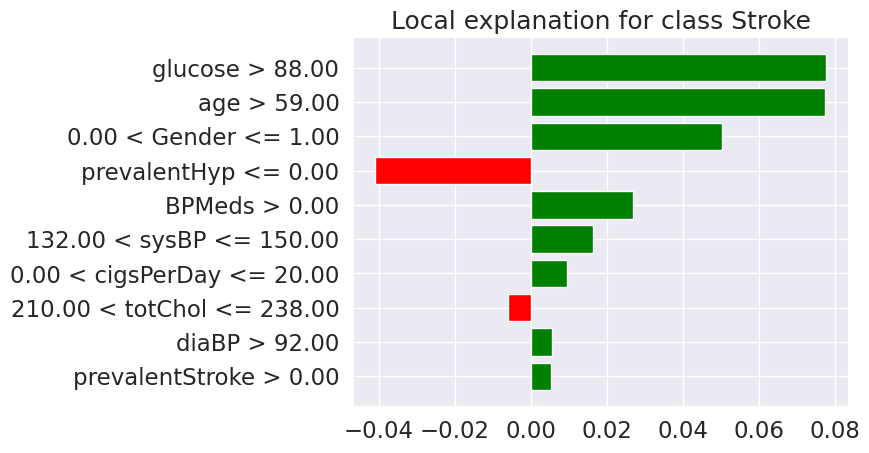

In [ ]:
exp.show_in_notebook(show_all=False)
exp.as_pyplot_figure()
plt.show()

In [ ]:
fig.write_html("lime_feature_importance.html")
print("Interactive plot saved as 'lime_feature_importance.html'")

Interactive plot saved as 'lime_feature_importance.html'


In [ ]:
import plotly.graph_objects as go

fig = go.Figure()
for feature in features:
    fig.add_trace(go.Box(y=X_train[feature], name=feature, boxpoints='all', jitter=0.5, pointpos=-1.8))
    fig.add_trace(go.Scatter(x=[feature], y=[user_input[feature]], mode='markers', name='User Input', marker=dict(color='red', size=10)))

fig.update_layout(
    title="Feature Distribution with User Inputs",
    xaxis_title="Features",
    yaxis_title="Values",
    showlegend=True
)
fig.show()


In [ ]:
probas = model.predict_proba(user_input_np)[0]
class_labels = ['No Stroke', 'Stroke']

fig = go.Figure(
    [go.Bar(x=class_labels, y=probas, marker_color=['blue', 'green'])]
)

fig.update_layout(
    title="Prediction Probabilities",
    xaxis_title="Class",
    yaxis_title="Probability",
    yaxis=dict(range=[0, 1])
)
fig.show()


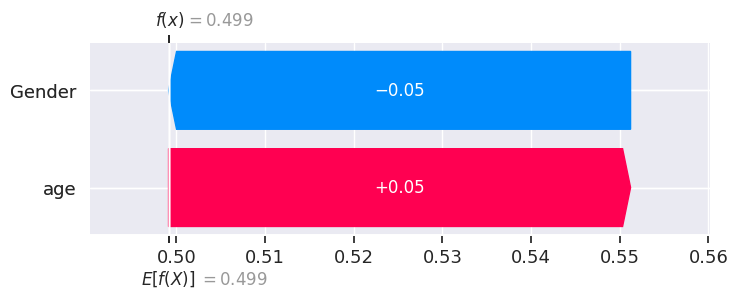

In [ ]:
import shap
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(user_input_np)
shap.waterfall_plot(shap.Explanation(values=shap_values[0,0], base_values=explainer.expected_value[0], feature_names=features))

In [ ]:
import plotly.express as px
corr_matrix = X_train.corr()  # Compute correlation matrix

fig = px.imshow(
    corr_matrix,
    title="Feature Correlation Matrix",
    color_continuous_scale="RdBu",
    zmin=-1, zmax=1
)

fig.update_layout(
    title="Correlation Matrix",
    xaxis_title="Features",
    yaxis_title="Features"
)
fig.show()
